In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import glob
import re
import seaborn as sns
from collections import defaultdict
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px
import plotly.graph_objects as go
from sklearn.metrics import (
    adjusted_rand_score,
    normalized_mutual_info_score,
    fowlkes_mallows_score,
    homogeneity_completeness_v_measure
)

# Load generation Params

In [2]:
dir = "output"
with open("./data/gen_log.txt") as f:
    text = f.read()

# param_pat = re.compile(r"(\w+)\s*[:=]\s*(\d+)")
# params = {key: int(val) for key, val in param_pat.findall(text)}

comb_match = re.search(r'^combination\s*[:=]\s*(\d+)', text, re.MULTILINE)
combination = comb_match.group(1) if comb_match else None

scalar_keys = ("n_obs_per_clust", "n_clust", "N", "seed")
scalar_pat  = rf'^({"|".join(scalar_keys)})\s*[:=]\s*(\d+)\s*$'
scalars = {k: int(v) for k, v in re.findall(scalar_pat, text, re.MULTILINE)}

n_obs_per_clust = scalars["n_obs_per_clust"]
n_clust         = scalars["n_clust"]
N               = scalars["N"]
seed            = scalars["seed"]

print("combination     =", combination)        
print("n_obs_per_clust =", n_obs_per_clust)    
print("n_clust         =", n_clust)            
print("N               =", N)                  
print("seed            =", seed)               

combination     = 021102
n_obs_per_clust = 30
n_clust         = 3
N               = 50
seed            = 773623948


# Choose visualization Params

In [3]:
s =  12 # between 0 and N-1
u = "true" # or "true","example"

In [4]:
block = re.search(r"u:\s*\[\s*([\s\S]*?)\]", text).group(1)
nums  = [float(x) for x in re.findall(r"-?\d+\.\d+(?:[eE][+-]?\d+)?", block)]
if u == "true":
    u = np.array(nums)[s]
else:
    u = 0.5
print("u               =", u)

u               = 0.483488


# Load data

In [5]:
output_dir = "output"
data_dir = "data"

dirs = ["reg", "non_reg"]
dims = ["1d", "2d", "3d"]
types = ["gauss", "wave", "warped_bump"]

# Load all data in a dictionary with sub directories
output = {}
for d in dirs:
    output[d] = {}
    for d1 in dims:
        output[d][d1] = {}
        for d2 in types:
            path = os.path.join(output_dir, d, d1, d2)
            centroids_path = os.path.join(path, "centroids.csv")
            memberships_path = os.path.join(path, "memberships.csv")

            subdict = {}
            if os.path.isfile(centroids_path):
                subdict["centroids"] = pd.read_csv(centroids_path, header=None)
            if os.path.isfile(memberships_path):
                subdict["memberships"] = pd.read_csv(memberships_path, header=None)

            output[d][d1][d2] = subdict

data = {}
for d1 in dims:
    data[d1] = {}
    data[d1]["nodes"] = pd.read_csv(os.path.join(data_dir, d1, "nodes.csv"), header=None)
    for d2 in types:
        path = os.path.join(data_dir, d1, d2)
        run_files = glob.glob(os.path.join(path, f"{d2}_*.csv"))
        run_files.sort(key=lambda f: int(os.path.splitext(os.path.basename(f))[0].split('_')[-1]))
        runs = [pd.read_csv(f, header=None) for f in run_files]
        data[d1][d2] = runs

results = {}


# 1D

In [6]:
centers = {}
centers["1d"] = {}

def warp(x):
    return x + 0.1 * np.sin(2 * np.pi * x)

def dome_1d(x):
    d = x - 0.5
    return np.maximum(1 - 16 * d**2, 0.0)

def wave_1d_0(x):
    # Control points
    knots = np.array([0.0, 0.25, 0.5, 0.75, 1.0])
    values = np.array([0.0, 0.8, 0.2, 1.0, 0.0])
    
    y = np.zeros_like(x)
    
    # Loop over each segment and interpolate
    for i in range(len(knots) - 1):
        mask = (x >= knots[i]) & (x <= knots[i+1])
        t = (x[mask] - knots[i]) / (knots[i+1] - knots[i])
        t_smooth = t * t * (3 - 2 * t)  # Smoothstep interpolation
        y[mask] = values[i] + (values[i+1] - values[i]) * t_smooth

    return y
    # return np.exp(-((x - 0.3) / 0.1)**2) + 0.8 * np.exp(-((x - 0.7) / 0.15)**2)
    # return dome_1d(warp(x))
    d = x - 0.5
    # return np.maximum(1 - 16 * d**2 + 2 * d**3, 0)
    d = x - 0.5
    a = 0.2
    return np.maximum(1 - 8 * d**2 + a * d**3 + 0.1 * np.sin(20 * x), 0.0)



#wave_1d_0 = lambda x: np.maximum(1 - 10/3*np.abs(x - 0.5), 0.0)
wave_1d_s1 = lambda x: wave_1d_0(x - 0.1)
wave_1d_s2 = lambda x: wave_1d_0(x + 0.1)

centers["1d"]["wave"] = []
if combination == "001122":
    centers["1d"]["wave"].append(lambda x: u*wave_1d_0(x) + (1-u)*wave_1d_s1(x))
    centers["1d"]["wave"].append(lambda x: u*wave_1d_0(x) + (1-u)*wave_1d_s2(x))
    centers["1d"]["wave"].append(lambda x: u*wave_1d_s1(x) + (1-u)*wave_1d_s2(x))
if combination == "021102":
    centers["1d"]["wave"].append(lambda x: u*wave_1d_0(x) + (1-u)*wave_1d_s1(x))
    centers["1d"]["wave"].append(lambda x: u*wave_1d_s2(x) + (1-u)*wave_1d_0(x))
    centers["1d"]["wave"].append(lambda x: u*wave_1d_s1(x) + (1-u)*wave_1d_s2(x))   



# def gauss_1d_0(x):
#     # Base spline interpolation
#     knots = np.array([0.0, 0.33, 0.66, 1.0])
#     values = np.array([0.0, 0.7, 0.4, 0.0])
    
#     spline_y = np.zeros_like(x)
#     for i in range(len(knots) - 1):
#         mask = (x >= knots[i]) & (x <= knots[i+1])
#         t = (x[mask] - knots[i]) / (knots[i+1] - knots[i])
#         t_smooth = t * t * (3 - 2 * t)
#         spline_y[mask] = values[i] + (values[i+1] - values[i]) * t_smooth

#     # Bump envelope
#     bump = np.zeros_like(x)
#     inner_mask = (x > 0.2) & (x < 0.8)
#     s = (x[inner_mask] - 0.2) / 0.6
#     bump[inner_mask] = np.exp(-1.0 / (s * (1 - s)))

#     return spline_y * bump
#     return dome_1d(x)
#     # return dome_1d(warp(x))

gauss_1d_0 = lambda x: np.exp(-(x - 0.5)**2 / 0.1)
gauss_1d_s1 = lambda x: gauss_1d_0(x - 0.1)
gauss_1d_s2 = lambda x: gauss_1d_0(x + 0.1)

centers["1d"]["gauss"] = []
if combination == "001122":
    centers["1d"]["gauss"].append(lambda x: u*gauss_1d_0(x) + (1-u)*gauss_1d_s1(x))
    centers["1d"]["gauss"].append(lambda x: u*gauss_1d_0(x) + (1-u)*gauss_1d_s2(x))
    centers["1d"]["gauss"].append(lambda x: u*gauss_1d_s1(x) + (1-u)*gauss_1d_s2(x))
if combination == "021102":
    centers["1d"]["gauss"].append(lambda x: u*gauss_1d_0(x) + (1-u)*gauss_1d_s1(x))
    centers["1d"]["gauss"].append(lambda x: u*gauss_1d_s2(x) + (1-u)*gauss_1d_0(x))
    centers["1d"]["gauss"].append(lambda x: u*gauss_1d_s1(x) + (1-u)*gauss_1d_s2(x))

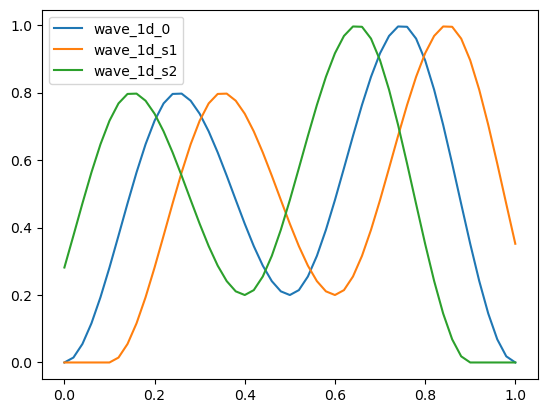

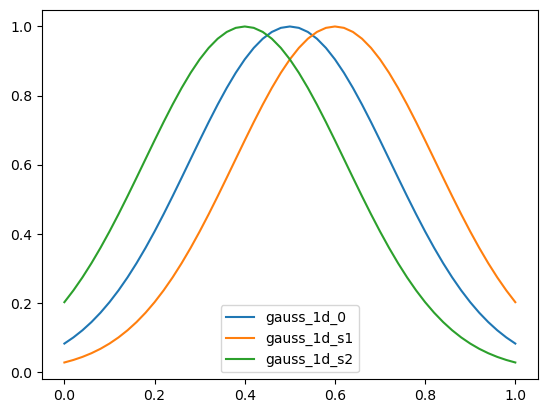

In [7]:
x1d_unique = data["1d"]["nodes"].iloc[:, 0].unique()

plt.figure()
plt.plot(x1d_unique, wave_1d_0(x1d_unique), label="wave_1d_0")
plt.plot(x1d_unique, wave_1d_s1(x1d_unique), label="wave_1d_s1")
plt.plot(x1d_unique, wave_1d_s2(x1d_unique), label="wave_1d_s2")
plt.legend()
plt.show()

plt.figure()
plt.plot(x1d_unique, gauss_1d_0(x1d_unique), label="gauss_1d_0")
plt.plot(x1d_unique, gauss_1d_s1(x1d_unique), label="gauss_1d_s1")
plt.plot(x1d_unique, gauss_1d_s2(x1d_unique), label="gauss_1d_s2")
plt.legend()
plt.show()

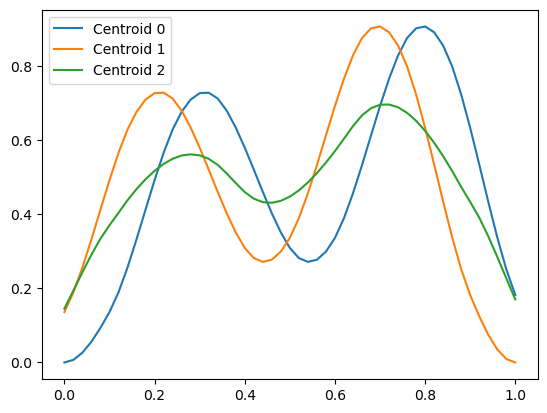

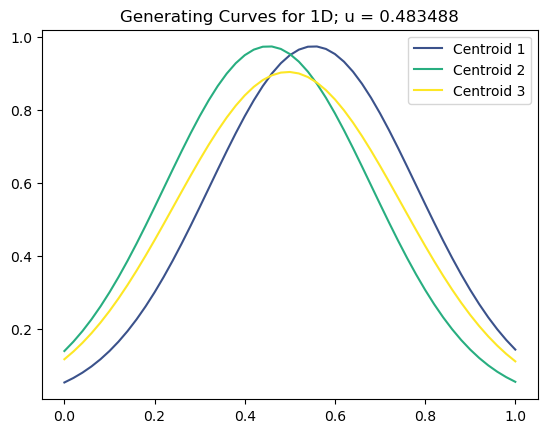

In [8]:
plt.figure()
i = 0
for f in centers["1d"]["wave"]:
    plt.plot(x1d_unique, f(x1d_unique), label=f"Centroid {i}")
    i += 1
plt.legend()
plt.show()

light_viridis = sns.color_palette("viridis", as_cmap=True)
colors = [light_viridis(x) for x in np.linspace(0.25, 1, 3)]

plt.figure()
i = 0
for f in centers["1d"]["gauss"]:
    plt.plot(x1d_unique, f(x1d_unique), label=f"Centroid {i+1}", color=colors[i])
    i += 1
plt.legend()
plt.title("Generating Curves for 1D; u = " + str(u))
plt.show()

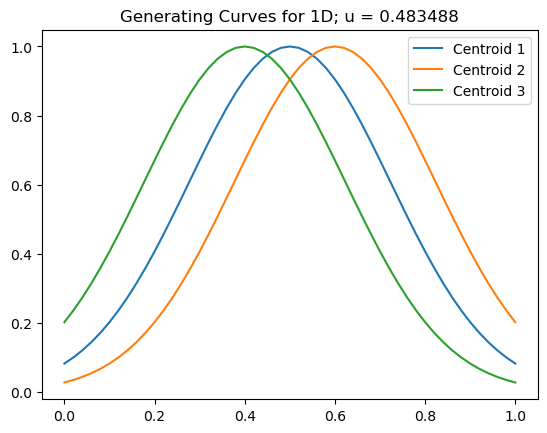

In [9]:
plt.figure()
plt.plot(x1d_unique, gauss_1d_0(x1d_unique), label="Centroid 1")
plt.plot(x1d_unique, gauss_1d_s1(x1d_unique), label="Centroid 2")
plt.plot(x1d_unique, gauss_1d_s2(x1d_unique), label="Centroid 3")
plt.title("Generating Curves for 1D; u = " + str(u))
plt.legend()
plt.show()

## Sample from clusters

In [10]:
# Using generation 0: 
for i in range(n_clust):
    plt.plot(data["1d"]["nodes"].iloc[:,0], data["1d"]["wave"][s].iloc[i*n_obs_per_clust,:], label=f"Sample {i}")
plt.legend()
plt.show()

for i in range(n_clust):
    plt.figure(figsize=(10, 3))
    plt.plot(data["1d"]["nodes"].iloc[:,0], data["1d"]["wave"][s].iloc[i*n_obs_per_clust,:], label=f"Sample {i}", color=f"C{i}")
    plt.legend()
    plt.show()

IndexError: list index out of range

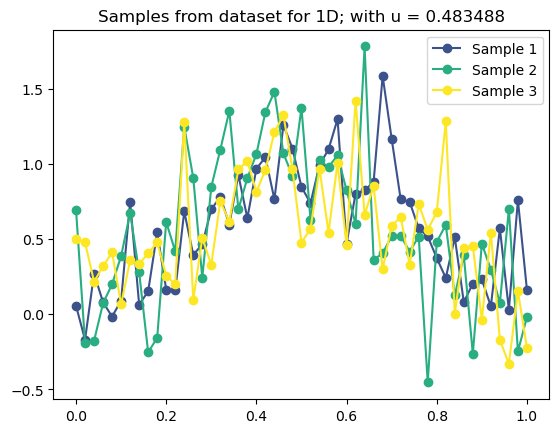

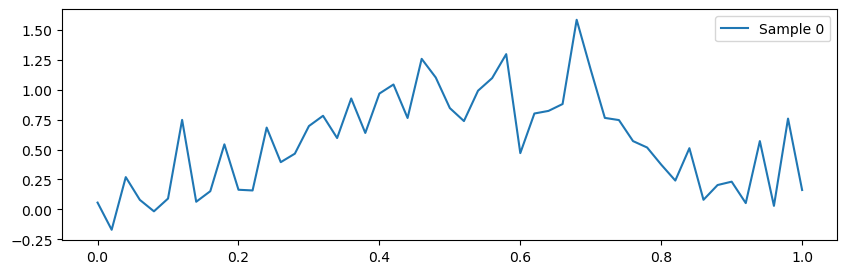

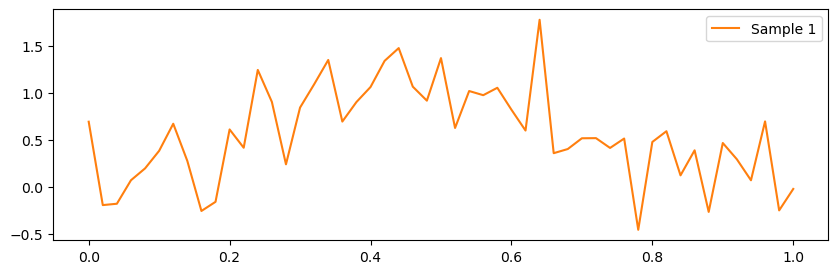

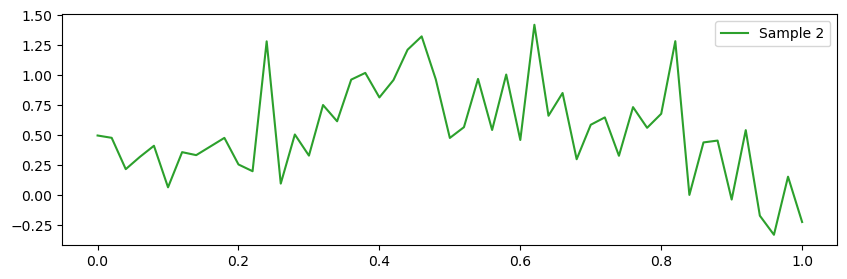

In [11]:
# Using generation 0: 
for i in range(n_clust):
    plt.plot(data["1d"]["nodes"].iloc[:,0], data["1d"]["gauss"][s].iloc[i*n_obs_per_clust,:], '-o',label=f"Sample {i+1}", color=colors[i])
plt.legend()
plt.title("Samples from dataset for 1D; with u = " + str(u))
plt.show()

for i in range(n_clust):
    plt.figure(figsize=(10, 3))
    plt.plot(data["1d"]["nodes"].iloc[:,0], data["1d"]["gauss"][s].iloc[i*n_obs_per_clust,:], label=f"Sample {i}", color=f"C{i}")
    plt.legend()
    plt.show()

In [12]:
# Using generation 0: 
for i in range(n_clust):
    plt.plot(data["1d"]["nodes"].iloc[:,0], data["1d"]["warped_bump"][s].iloc[i*n_obs_per_clust,:], label=f"Sample {i}")
plt.legend()
plt.show()

for i in range(n_clust):
    plt.figure(figsize=(10, 3))
    plt.plot(data["1d"]["nodes"].iloc[:,0], data["1d"]["warped_bump"][s].iloc[i*n_obs_per_clust,:], label=f"Sample {i}", color=f"C{i}")
    plt.legend()
    plt.show()

IndexError: list index out of range

## Centroids

In [13]:
for i in range(n_clust):
    plt.plot(data["1d"]["nodes"].iloc[:,0], output["non_reg"]["1d"]["wave"]["centroids"].iloc[s*n_clust + i,:], label=f"Centroid {i}")
plt.legend()
plt.show()

KeyError: 'centroids'

In [14]:
for i in range(n_clust):
    plt.plot(data["1d"]["nodes"].iloc[:,0], output["reg"]["1d"]["wave"]["centroids"].iloc[s*n_clust + i,:], label=f"Centroid {i}")
plt.legend()
plt.show()

KeyError: 'centroids'

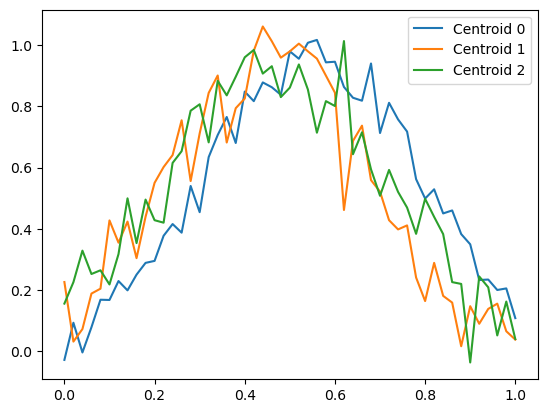

In [15]:
for i in range(n_clust):
    plt.plot(data["1d"]["nodes"].iloc[:,0], output["non_reg"]["1d"]["gauss"]["centroids"].iloc[s*n_clust + i,:], label=f"Centroid {i}")
plt.legend()
plt.show()

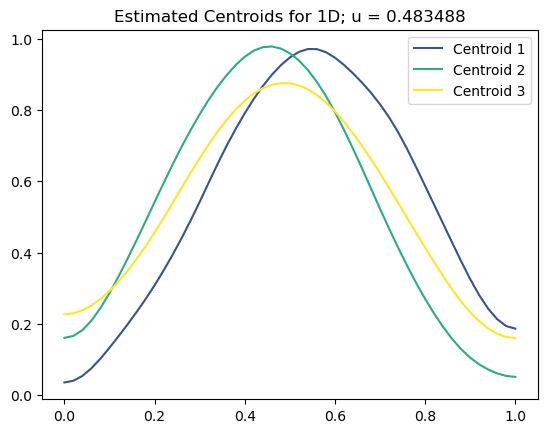

In [16]:
for i in range(n_clust):
    plt.plot(data["1d"]["nodes"].iloc[:,0], output["reg"]["1d"]["gauss"]["centroids"].iloc[s*n_clust + i,:], label=f"Centroid {i+1}", color=colors[i])
plt.title("Estimated Centroids for 1D; u = " + str(u))
plt.legend()
plt.show()

In [17]:
for i in range(n_clust):
    plt.plot(data["1d"]["nodes"].iloc[:,0], output["non_reg"]["1d"]["warped_bump"]["centroids"].iloc[s*n_clust + i,:], label=f"Centroid {i}")
plt.legend()
plt.show()

KeyError: 'centroids'

In [18]:
for i in range(n_clust):
    plt.plot(data["1d"]["nodes"].iloc[:,0], output["reg"]["1d"]["warped_bump"]["centroids"].iloc[s*n_clust + i,:], label=f"Centroid {i}")
plt.legend()
plt.show()

KeyError: 'centroids'

## Accuracy

In [19]:
labels_true = np.array([i for i in range(n_clust) for _ in range(n_obs_per_clust)])
metrics = ["ari", "nmi", "fmi", "homogeneity", "completeness", "v_measure"]
results["1d"] = defaultdict(lambda: defaultdict(lambda: defaultdict(dict)))

for typ in ["reg", "non_reg"]:
    for curve in ["gauss"]: #, "wave", "warped_bump"
        labels_pred = output[typ]["1d"][curve]["memberships"]
        N = labels_pred.shape[0]

        # Compute raw metrics for each run
        results["1d"][typ][curve]["ari"]["raw"] = [adjusted_rand_score(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]
        results["1d"][typ][curve]["nmi"]["raw"] = [normalized_mutual_info_score(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]
        results["1d"][typ][curve]["fmi"]["raw"] = [fowlkes_mallows_score(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]

        hcv = [homogeneity_completeness_v_measure(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]
        h, c, v = zip(*hcv)
        results["1d"][typ][curve]["homogeneity"]["raw"] = list(h)
        results["1d"][typ][curve]["completeness"]["raw"] = list(c)
        results["1d"][typ][curve]["v_measure"]["raw"] = list(v)

        # Compute means
        for m in metrics:
            results["1d"][typ][curve][m]["mean"] = np.mean(results["1d"][typ][curve][m]["raw"])

rows = []
for curve in ["gauss", "wave", "warped_bump"]:
    for typ in ["reg", "non_reg"]:
        row = {
            "Type": typ,
            "Curve": curve,
        }
        for m in metrics:
            row[m.upper()] = results["1d"][typ][curve][m]["mean"]
        rows.append(row)

df = pd.DataFrame(rows)
df


KeyError: 'mean'

# 2D

In [20]:
Z = {}
surfaces = {}

x2d_unique = data["2d"]["nodes"].iloc[:,0].unique()
y2d_unique = data["2d"]["nodes"].iloc[:,1].unique()
X2d, Y2d = np.meshgrid(x2d_unique, y2d_unique)

for n in range(5):
    Z[f"samples_{n}"] = {}
    surfaces[f"samples_{n}"] = {}
    for curve in ["gauss"]: #, "wave"
        Z[f"samples_{n}"][curve] = []
        surfaces[f"samples_{n}"][curve] = []
        for i in range(n_clust):
            surfaces[f"samples_{n}"][curve].append(pd.DataFrame(np.zeros((data["2d"]["nodes"].shape[0], 3))))
            for j in range(data["2d"]["nodes"].shape[0]):
                surfaces[f"samples_{n}"][curve][i].iloc[j, 0] = data["2d"]["nodes"].iloc[j, 0]
                surfaces[f"samples_{n}"][curve][i].iloc[j, 1] = data["2d"]["nodes"].iloc[j, 1]
                surfaces[f"samples_{n}"][curve][i].iloc[j, 2] = data["2d"][curve][s].iloc[i*n_obs_per_clust + n, j]
            surfaces[f"samples_{n}"][curve][i].columns = ['x', 'y', 'z']
            Z[f"samples_{n}"][curve].append(surfaces[f"samples_{n}"][curve][i].pivot_table(index='y', columns='x', values='z').values)

Z["centroids"] = {}
surfaces["centroids"] = {}
for typ in ["reg", "non_reg"]:
    Z["centroids"][typ] = {}
    surfaces["centroids"][typ] = {}
    for curve in ["gauss"]: #, "wave"
        Z["centroids"][typ][curve] = []
        surfaces["centroids"][typ][curve] = []
        for i in range(n_clust):
            surfaces["centroids"][typ][curve].append(pd.DataFrame(np.zeros((data["2d"]["nodes"].shape[0], 3))))
            for j in range(data["2d"]["nodes"].shape[0]):
                surfaces["centroids"][typ][curve][i].iloc[j, 0] = data["2d"]["nodes"].iloc[j, 0]
                surfaces["centroids"][typ][curve][i].iloc[j, 1] = data["2d"]["nodes"].iloc[j, 1]
                surfaces["centroids"][typ][curve][i].iloc[j, 2] = output[typ]["2d"][curve]["centroids"].iloc[s*n_clust + i, j]
            surfaces["centroids"][typ][curve][i].columns = ['x', 'y', 'z']
            Z["centroids"][typ][curve].append(surfaces["centroids"][typ][curve][i].pivot_table(index='y', columns='x', values='z').values)

In [21]:
centers["2d"] = {}

def wave_2d_0(x, y):
    dx = x - 0.5
    dy = y - 0.5
    a = 0.2  # chosen constant
    
    r2 = dx**2 + dy**2
    base = 1.0 - 8 * r2
    warped = base + a * (dx**3 + dy**3)+ 0.1 * np.sin(20 * (x+y))
    return np.maximum(warped, 0.0)

# wave_2d_0 = lambda x, y: np.maximum(1 - 10 * np.abs(x + y - 1), 0.0)
# wave_2d_0 = lambda x, y: np.maximum(1 - 10/3*np.maximum(np.abs(x - 0.5), np.abs(y - 0.5)), 0.0)
wave_2d_s1 = lambda x, y: wave_2d_0(x - 0.1, y - 0.1)
wave_2d_s2 = lambda x, y: wave_2d_0(x + 0.1, y + 0.1)

centers["2d"]["wave"] = []
if combination == "001122":
    centers["2d"]["wave"].append(lambda x,y: u*wave_2d_0(x,y) + (1-u)*wave_2d_s1(x,y))
    centers["2d"]["wave"].append(lambda x,y: u*wave_2d_0(x,y) + (1-u)*wave_2d_s2(x,y))
    centers["2d"]["wave"].append(lambda x,y: u*wave_2d_s1(x,y) + (1-u)*wave_2d_s2(x,y))
if combination == "021102":
    centers["2d"]["wave"].append(lambda x,y: u*wave_2d_0(x,y) + (1-u)*wave_2d_s1(x,y))
    centers["2d"]["wave"].append(lambda x,y: u*wave_2d_s2(x,y) + (1-u)*wave_2d_0(x,y))
    centers["2d"]["wave"].append(lambda x,y: u*wave_2d_s1(x,y) + (1-u)*wave_2d_s2(x,y))

gauss_2d_0 = lambda x, y: np.exp(-((x - 0.5)**2 + (y - 0.5)**2) / 0.1)
gauss_2d_s1 = lambda x, y: gauss_2d_0(x - 0.1, y)
gauss_2d_s2 = lambda x, y: gauss_2d_0(x + 0.1, y)

centers["2d"]["gauss"] = []
if combination == "001122":
    centers["2d"]["gauss"].append(lambda x,y: u*gauss_2d_0(x,y) + (1-u)*gauss_2d_s1(x,y))
    centers["2d"]["gauss"].append(lambda x,y: u*gauss_2d_0(x,y) + (1-u)*gauss_2d_s2(x,y))
    centers["2d"]["gauss"].append(lambda x,y: u*gauss_2d_s1(x,y) + (1-u)*gauss_2d_s2(x,y))
if combination == "021102":
    centers["2d"]["gauss"].append(lambda x,y: u*gauss_2d_0(x,y) + (1-u)*gauss_2d_s1(x,y))
    centers["2d"]["gauss"].append(lambda x,y: u*gauss_2d_s2(x,y) + (1-u)*gauss_2d_0(x,y))
    centers["2d"]["gauss"].append(lambda x,y: u*gauss_2d_s1(x,y) + (1-u)*gauss_2d_s2(x,y))

In [22]:
for f in [wave_2d_0, wave_2d_s1, wave_2d_s2]:
    fig = go.Figure()
    fig.add_trace(go.Surface(z=f(X2d,Y2d), x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

In [23]:
for f in [wave_2d_0, wave_2d_s1, wave_2d_s2]:
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=f(X2d,Y2d),
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )
    fig.show()

In [24]:
for f in [gauss_2d_0, gauss_2d_s1, gauss_2d_s2]:
    fig = go.Figure()
    fig.add_trace(go.Surface(z=f(X2d,Y2d), x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

In [25]:
for f in [gauss_2d_0, gauss_2d_s1, gauss_2d_s2]:
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=f(X2d,Y2d),
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )
    for gx in np.arange(min(x2d_unique), max(x2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[gx, gx],
            y=[min(y2d_unique), max(y2d_unique)],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))

    for gy in np.arange(min(y2d_unique), max(y2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[min(x2d_unique), max(x2d_unique)],
            y=[gy, gy],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))

    fig.update_xaxes(range=[0, 1])
    fig.update_yaxes(range=[0, 1])
    fig.show()

In [ ]:
for f in centers["2d"]["wave"]:
    fig = go.Figure()
    fig.add_trace(go.Surface(z=f(X2d,Y2d), x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

In [ ]:
for f in centers["2d"]["wave"]:
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=f(X2d,Y2d),
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )
    fig.show()

In [ ]:
for f in centers["2d"]["gauss"]:
    fig = go.Figure()
    fig.add_trace(go.Surface(z=f(X2d,Y2d), x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

In [ ]:
for f in centers["2d"]["gauss"]:
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=f(X2d,Y2d),
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )

    for gx in np.arange(min(x2d_unique), max(x2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[gx, gx],
            y=[min(y2d_unique), max(y2d_unique)],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))

    for gy in np.arange(min(y2d_unique), max(y2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[min(x2d_unique), max(x2d_unique)],
            y=[gy, gy],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))

    fig.update_xaxes(range=[0, 1])
    fig.update_yaxes(range=[0, 1])
    fig.show()

## Sample from clusters

In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Surface(z=Z["samples"]["wave"][i], x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z["samples"]["wave"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )
    fig.show()


In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Surface(z=Z["samples"]["gauss"][i], x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

In [26]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z["samples_0"]["gauss"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )

    for gx in np.arange(min(x2d_unique), max(x2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[gx, gx],
            y=[min(y2d_unique), max(y2d_unique)],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))

    for gy in np.arange(min(y2d_unique), max(y2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[min(x2d_unique), max(x2d_unique)],
            y=[gy, gy],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))

    fig.update_xaxes(range=[0, 1])
    fig.update_yaxes(range=[0, 1])
    
    fig.show()


In [27]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z["samples_1"]["gauss"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )

    for gx in np.arange(min(x2d_unique), max(x2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[gx, gx],
            y=[min(y2d_unique), max(y2d_unique)],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))

    for gy in np.arange(min(y2d_unique), max(y2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[min(x2d_unique), max(x2d_unique)],
            y=[gy, gy],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))

    fig.update_xaxes(range=[0, 1])
    fig.update_yaxes(range=[0, 1])
    
    fig.show()


In [28]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z["samples_2"]["gauss"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )

    for gx in np.arange(min(x2d_unique), max(x2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[gx, gx],
            y=[min(y2d_unique), max(y2d_unique)],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))

    for gy in np.arange(min(y2d_unique), max(y2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[min(x2d_unique), max(x2d_unique)],
            y=[gy, gy],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))

    fig.update_xaxes(range=[0, 1])
    fig.update_yaxes(range=[0, 1])
    
    fig.show()


In [29]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z["samples_3"]["gauss"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )

    for gx in np.arange(min(x2d_unique), max(x2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[gx, gx],
            y=[min(y2d_unique), max(y2d_unique)],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))

    for gy in np.arange(min(y2d_unique), max(y2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[min(x2d_unique), max(x2d_unique)],
            y=[gy, gy],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))

    fig.update_xaxes(range=[0, 1])
    fig.update_yaxes(range=[0, 1])
    
    fig.show()


In [30]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z["samples_4"]["gauss"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )

    for gx in np.arange(min(x2d_unique), max(x2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[gx, gx],
            y=[min(y2d_unique), max(y2d_unique)],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))

    for gy in np.arange(min(y2d_unique), max(y2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[min(x2d_unique), max(x2d_unique)],
            y=[gy, gy],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))

    fig.update_xaxes(range=[0, 1])
    fig.update_yaxes(range=[0, 1])
    
    fig.show()


## Centroids

In [31]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Surface(z=Z["centroids"]["non_reg"]["wave"][i], x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

KeyError: 'wave'

In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Surface(z=Z["centroids"]["reg"]["wave"][i], x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z["centroids"]["non_reg"]["wave"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )
    fig.show()


In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z["centroids"]["reg"]["wave"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )
    fig.show()


In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Surface(z=Z["centroids"]["non_reg"]["gauss"][i], x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Surface(z=Z["centroids"]["reg"]["gauss"][i], x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z["centroids"]["non_reg"]["gauss"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )
    fig.show()


In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z["centroids"]["reg"]["gauss"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )

    for gx in np.arange(min(x2d_unique), max(x2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[gx, gx],
            y=[min(y2d_unique), max(y2d_unique)],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))

    for gy in np.arange(min(y2d_unique), max(y2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[min(x2d_unique), max(x2d_unique)],
            y=[gy, gy],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))

    fig.update_xaxes(range=[0, 1])
    fig.update_yaxes(range=[0, 1])
    fig.show()


## Accuracy

In [ ]:
labels_true = np.array([i for i in range(n_clust) for _ in range(n_obs_per_clust)])
metrics = ["ari", "nmi", "fmi", "homogeneity", "completeness", "v_measure"]
results["2d"] = defaultdict(lambda: defaultdict(lambda: defaultdict(dict)))

for typ in ["reg", "non_reg"]:
    for curve in ["gauss", "wave"]:
        labels_pred = output[typ]["2d"][curve]["memberships"]
        N = labels_pred.shape[0]

        # Compute raw metrics for each run
        results["2d"][typ][curve]["ari"]["raw"] = [adjusted_rand_score(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]
        results["2d"][typ][curve]["nmi"]["raw"] = [normalized_mutual_info_score(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]
        results["2d"][typ][curve]["fmi"]["raw"] = [fowlkes_mallows_score(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]

        hcv = [homogeneity_completeness_v_measure(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]
        h, c, v = zip(*hcv)
        results["2d"][typ][curve]["homogeneity"]["raw"] = list(h)
        results["2d"][typ][curve]["completeness"]["raw"] = list(c)
        results["2d"][typ][curve]["v_measure"]["raw"] = list(v)

        # Compute means
        for m in metrics:
            results["2d"][typ][curve][m]["mean"] = np.mean(results["2d"][typ][curve][m]["raw"])

rows = []
for curve in ["gauss", "wave"]:
    for typ in ["reg", "non_reg"]:
        row = {
            "Type": typ,
            "Curve": curve,
        }
        for m in metrics:
            row[m.upper()] = results["2d"][typ][curve][m]["mean"]
        rows.append(row)

df = pd.DataFrame(rows)
df


,Type,Curve,ARI,NMI,FMI,HOMOGENEITY,COMPLETENESS,V_MEASURE
0,reg,gauss,1.0,1.0,1.0,1.0,1.0,1.0
1,non_reg,gauss,1.0,1.0,1.0,1.0,1.0,1.0
2,reg,wave,1.0,1.0,1.0,1.0,1.0,1.0
3,non_reg,wave,1.0,1.0,1.0,1.0,1.0,1.0


# 3D

Samples and Centroids through paraview

## Accuracy

In [ ]:
labels_true = np.array([i for i in range(n_clust) for _ in range(n_obs_per_clust)])
metrics = ["ari", "nmi", "fmi", "homogeneity", "completeness", "v_measure"]
results["3d"] = defaultdict(lambda: defaultdict(lambda: defaultdict(dict)))

for typ in ["reg", "non_reg"]:
    for curve in ["gauss", "wave"]:
        labels_pred = output[typ]["3d"][curve]["memberships"]
        N = labels_pred.shape[0]

        # Compute raw metrics for each run
        results["3d"][typ][curve]["ari"]["raw"] = [adjusted_rand_score(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]
        results["3d"][typ][curve]["nmi"]["raw"] = [normalized_mutual_info_score(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]
        results["3d"][typ][curve]["fmi"]["raw"] = [fowlkes_mallows_score(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]

        hcv = [homogeneity_completeness_v_measure(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]
        h, c, v = zip(*hcv)
        results["3d"][typ][curve]["homogeneity"]["raw"] = list(h)
        results["3d"][typ][curve]["completeness"]["raw"] = list(c)
        results["3d"][typ][curve]["v_measure"]["raw"] = list(v)

        # Compute means
        for m in metrics:
            results["3d"][typ][curve][m]["mean"] = np.mean(results["3d"][typ][curve][m]["raw"])

rows = []
for curve in ["gauss", "wave"]:
    for typ in ["reg", "non_reg"]:
        row = {
            "Type": typ,
            "Curve": curve,
        }
        for m in metrics:
            row[m.upper()] = results["3d"][typ][curve][m]["mean"]
        rows.append(row)

df = pd.DataFrame(rows)
df


KeyError: 'memberships'

# Missing Data

## Load data missing

In [32]:
obs_patterns = {}
for d1 in ["1d", "2d", "3d"]:
    obs_patterns[d1] = {}
    for d2 in ["scatter", "area"]:
        obs_patterns[d1][d2] = []
        for n in range(N):
            path = os.path.join(data_dir, d1, "observation_patterns", d2, f"{d2}_{n}.csv")
            if os.path.isfile(path):
                obs_patterns[d1][d2].append(pd.read_csv(path, header=None))

output_missing = {}
for d1 in ["1d", "2d", "3d"]:
    output_missing[d1] = {}
    for d2 in ["scatter", "area"]:
        output_missing[d1][d2] = {}
        for d3 in ["wave", "gauss"]:
            output_missing[d1][d2][d3] = {}
            base_path = os.path.join(output_dir, "missing", d1, d2, d3)
            path = os.path.join(base_path, "memberships.csv")
            if os.path.isfile(path):
                output_missing[d1][d2][d3]["memberships"] = pd.read_csv(path, header=None)
            path = os.path.join(base_path, "centroids.csv")
            if os.path.isfile(path):
                output_missing[d1][d2][d3]["centroids"] = pd.read_csv(path, header=None)

results_missing = {}

## 1D

### Samples

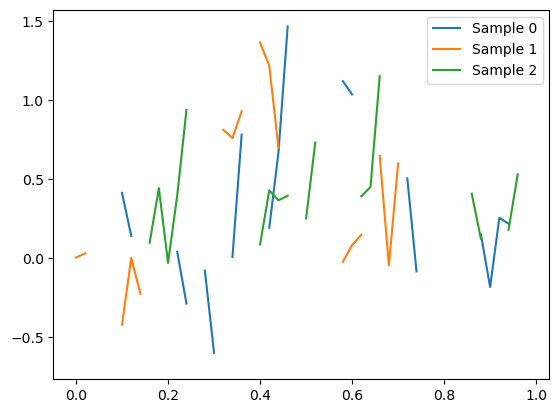

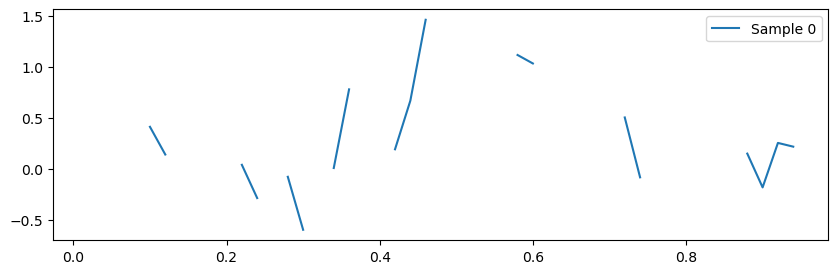

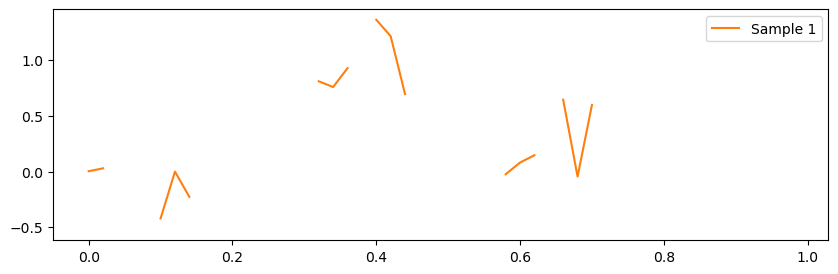

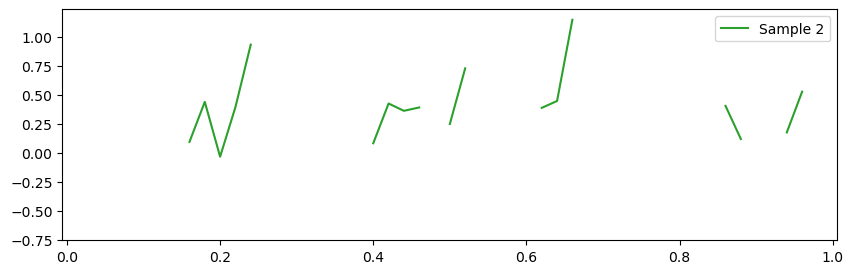

In [ ]:
sample_na = []
for i in range(n_clust):
    sample_na.append(data["1d"]["wave"][s].iloc[i*n_obs_per_clust, :].copy())
    sample_na[i][obs_patterns["1d"]["scatter"][s].iloc[i*n_obs_per_clust, :] == 0] = np.nan

for i in range(n_clust):
    plt.plot(data["1d"]["nodes"].iloc[:,0], sample_na[i], label=f"Sample {i}")
plt.legend()
plt.show()

for i in range(n_clust):
    plt.figure(figsize=(10, 3))
    plt.plot(data["1d"]["nodes"].iloc[:,0], sample_na[i], label=f"Sample {i}", color=f"C{i}")
    plt.legend()
    plt.show()

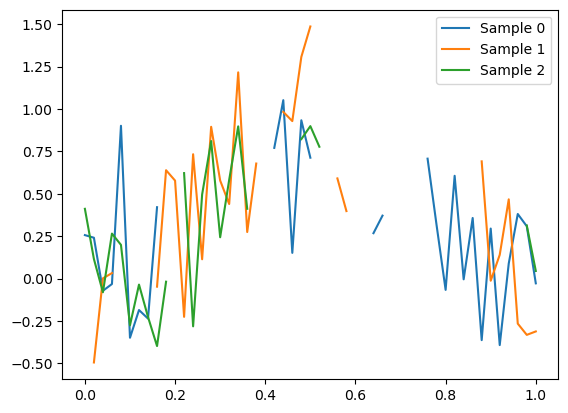

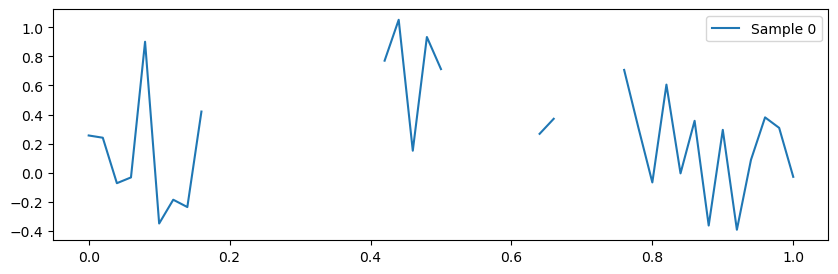

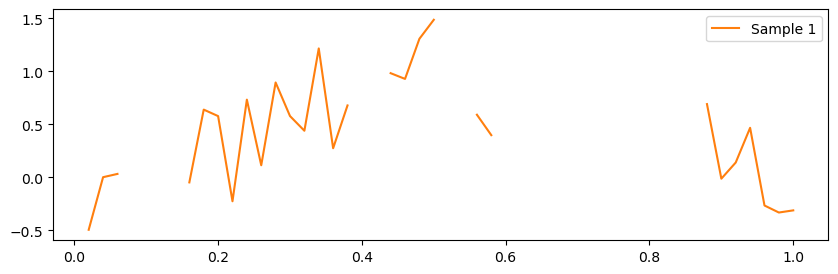

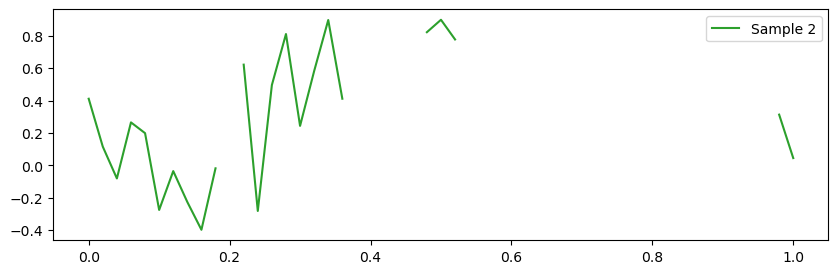

In [ ]:
sample_na = []
for i in range(n_clust):
    sample_na.append(data["1d"]["wave"][s].iloc[i*n_obs_per_clust, :].copy())
    sample_na[i][obs_patterns["1d"]["area"][s].iloc[i*n_obs_per_clust, :] == 0] = np.nan
    
for i in range(n_clust):
    plt.plot(data["1d"]["nodes"].iloc[:,0], sample_na[i], label=f"Sample {i}")
plt.legend()
plt.show()

for i in range(n_clust):
    plt.figure(figsize=(10, 3))
    plt.plot(data["1d"]["nodes"].iloc[:,0], sample_na[i], label=f"Sample {i}", color=f"C{i}")
    plt.legend()
    plt.show()

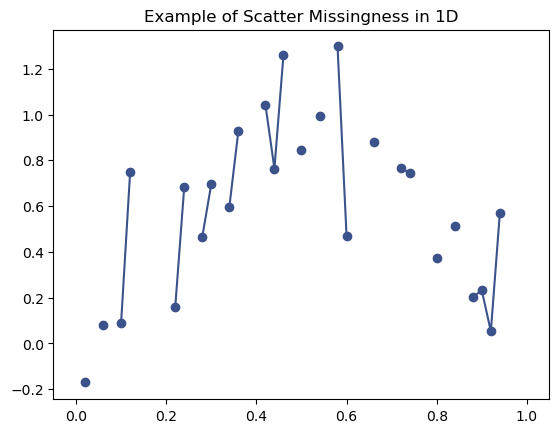

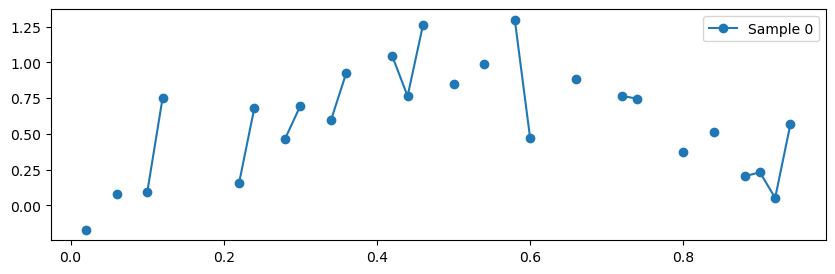

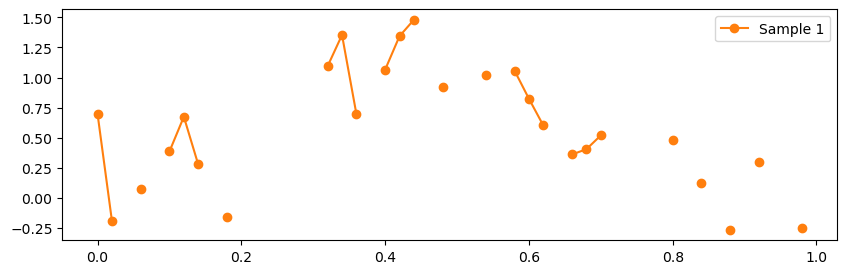

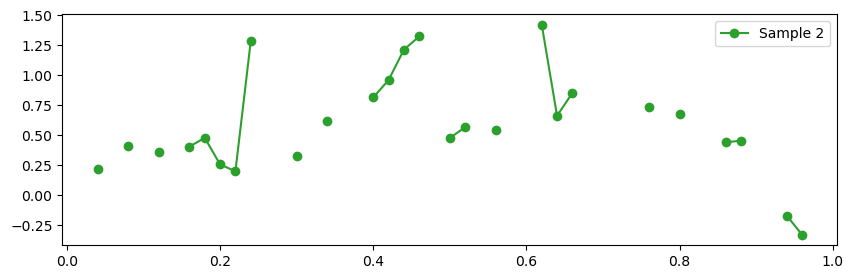

In [ ]:
sample_na = []
for i in range(n_clust):
    sample_na.append(data["1d"]["gauss"][s].iloc[i*n_obs_per_clust, :].copy())
    sample_na[i][obs_patterns["1d"]["scatter"][s].iloc[i*n_obs_per_clust, :] == 0] = np.nan
    
for i in [0]:
    plt.plot(data["1d"]["nodes"].iloc[:,0], sample_na[i], "o-",label=f"Sample {i}", color = colors[i])
    plt.title("Example of Scatter Missingness in 1D")
    plt.xlim(-0.05,1.05)
plt.show()

for i in range(n_clust):
    plt.figure(figsize=(10, 3))
    plt.plot(data["1d"]["nodes"].iloc[:,0], sample_na[i], "o-",label=f"Sample {i}", color=f"C{i}")
    plt.legend()
    plt.show()

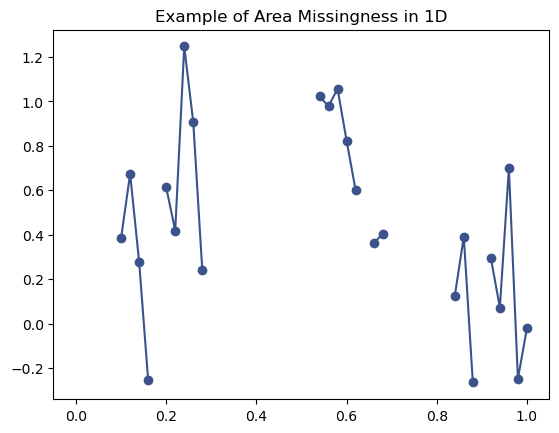

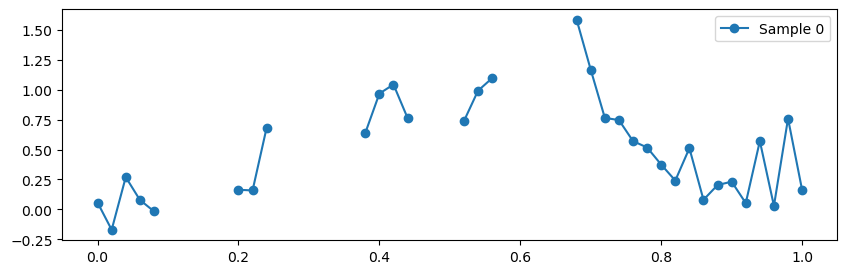

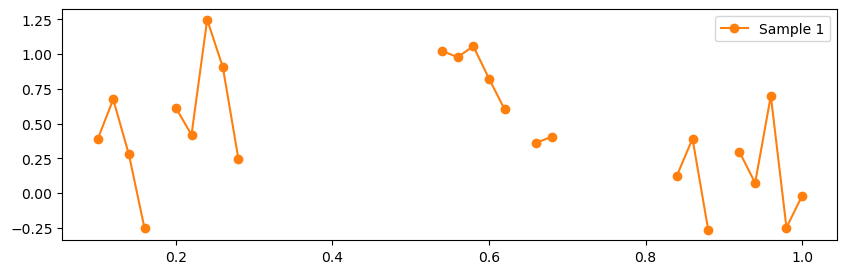

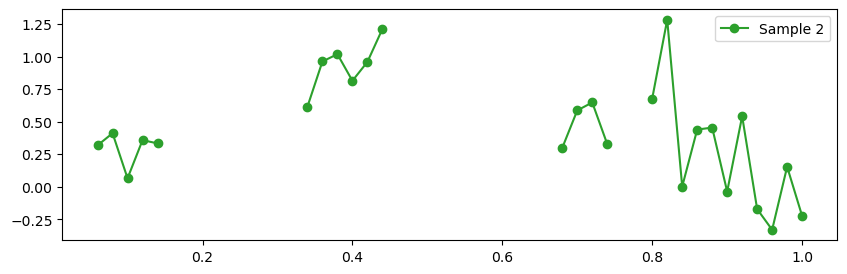

In [ ]:
sample_na = []
for i in range(n_clust):
    sample_na.append(data["1d"]["gauss"][s].iloc[i*n_obs_per_clust, :].copy())
    sample_na[i][obs_patterns["1d"]["area"][s].iloc[i*n_obs_per_clust, :] == 0] = np.nan
    
for i in [1]:
    plt.plot(data["1d"]["nodes"].iloc[:,0], sample_na[i], "-o", label=f"Sample {i}", color = colors[0])
    plt.title("Example of Area Missingness in 1D")
    plt.xlim(-0.05,1.05)
plt.show()

for i in range(n_clust):
    plt.figure(figsize=(10, 3))
    plt.plot(data["1d"]["nodes"].iloc[:,0], sample_na[i], "-o", label=f"Sample {i}", color=f"C{i}")
    plt.legend()
    plt.show()

### Centroids

In [ ]:
for i in range(n_clust):
    plt.plot(data["1d"]["nodes"].iloc[:,0], output_missing["1d"]["scatter"]["wave"]["centroids"].iloc[s*n_clust + i,:], label=f"Centroid {i}")
plt.legend()
plt.show()

KeyError: 'centroids'

In [ ]:
for i in range(n_clust):
    plt.plot(data["1d"]["nodes"].iloc[:,0], output_missing["1d"]["area"]["wave"]["centroids"].iloc[s*n_clust + i,:], label=f"Centroid {i}")
plt.legend()
plt.show()

KeyError: 'centroids'

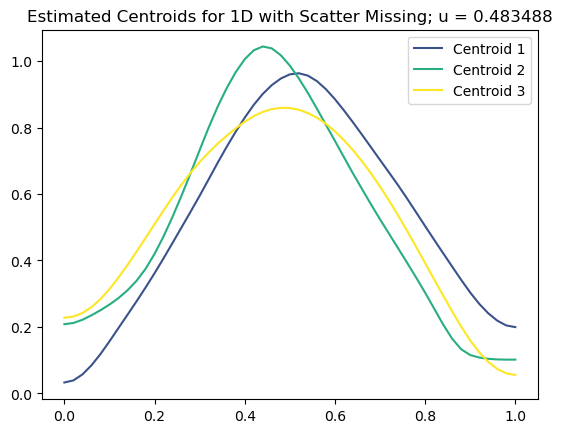

In [ ]:
for i in range(n_clust):
    plt.plot(data["1d"]["nodes"].iloc[:,0], output_missing["1d"]["scatter"]["gauss"]["centroids"].iloc[s*n_clust + i,:], label=f"Centroid {i+1}", color=colors[i])
plt.legend()
plt.title("Estimated Centroids for 1D with Scatter Missing; u = " + str(u))
plt.show()

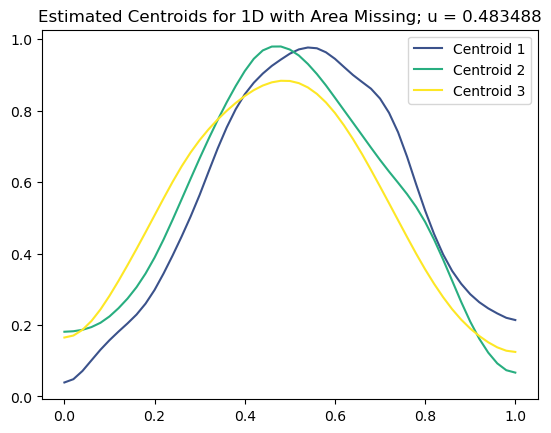

In [ ]:
idx = 0
for i in [0,2,1]:
    plt.plot(data["1d"]["nodes"].iloc[:,0], output_missing["1d"]["area"]["gauss"]["centroids"].iloc[s*n_clust + i,:], label=f"Centroid {idx + 1}", color=colors[idx])
    idx += 1
plt.legend()
plt.title("Estimated Centroids for 1D with Area Missing; u = " + str(u))
plt.show()

### Reconstructed Samples

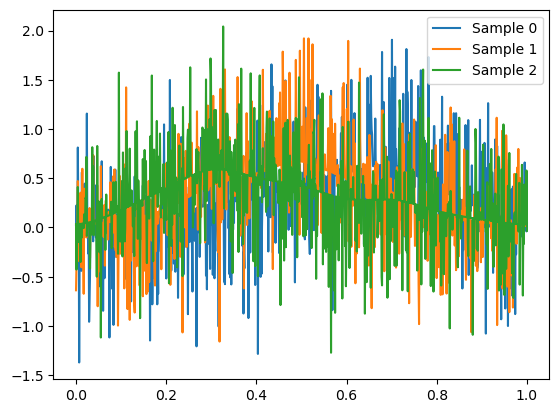

In [ ]:
recontructed = []
for i in range(n_clust):
    recontructed.append(data["1d"]["wave"][s].iloc[i*n_obs_per_clust, :].copy())
    idx = obs_patterns["1d"]["scatter"][s].iloc[i*n_obs_per_clust, :] == 0
    recontructed[i][idx] = output_missing["1d"]["scatter"]["wave"]["centroids"].iloc[s*n_clust + output_missing["1d"]["scatter"]["wave"]["memberships"].iloc[s, i*n_obs_per_clust],:][idx]
    
for i in range(n_clust):
    plt.plot(data["1d"]["nodes"].iloc[:,0], recontructed[i], label=f"Sample {i}")
plt.legend()
plt.show()

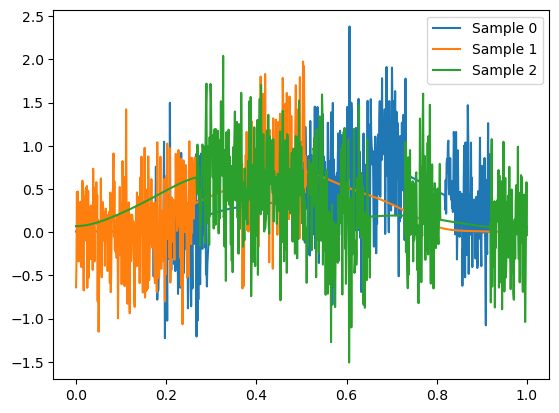

In [ ]:
recontructed = []
for i in range(n_clust):
    recontructed.append(data["1d"]["wave"][s].iloc[i*n_obs_per_clust, :].copy())
    idx = obs_patterns["1d"]["area"][s].iloc[i*n_obs_per_clust, :] == 0
    recontructed[i][idx] = output_missing["1d"]["area"]["wave"]["centroids"].iloc[s*n_clust + output_missing["1d"]["area"]["wave"]["memberships"].iloc[s, i*n_obs_per_clust],:][idx]
    
for i in range(n_clust):
    plt.plot(data["1d"]["nodes"].iloc[:,0], recontructed[i], label=f"Sample {i}")
plt.legend()
plt.show()

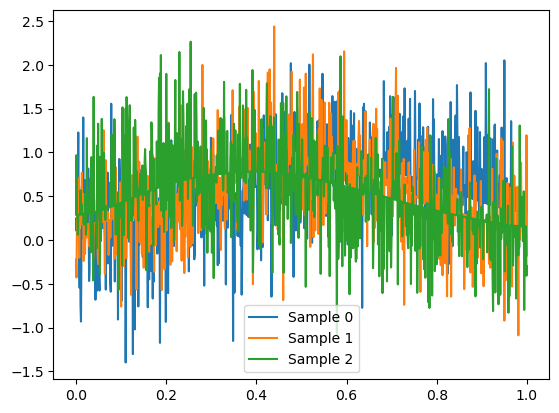

In [ ]:
recontructed = []
for i in range(n_clust):
    recontructed.append(data["1d"]["gauss"][s].iloc[i*n_obs_per_clust, :].copy())
    idx = obs_patterns["1d"]["scatter"][s].iloc[i*n_obs_per_clust, :] == 0
    recontructed[i][idx] = output_missing["1d"]["scatter"]["gauss"]["centroids"].iloc[s*n_clust + output_missing["1d"]["scatter"]["gauss"]["memberships"].iloc[s, i*n_obs_per_clust],:][idx]
    
for i in range(n_clust):
    plt.plot(data["1d"]["nodes"].iloc[:,0], recontructed[i], label=f"Sample {i}")
plt.legend()
plt.show()

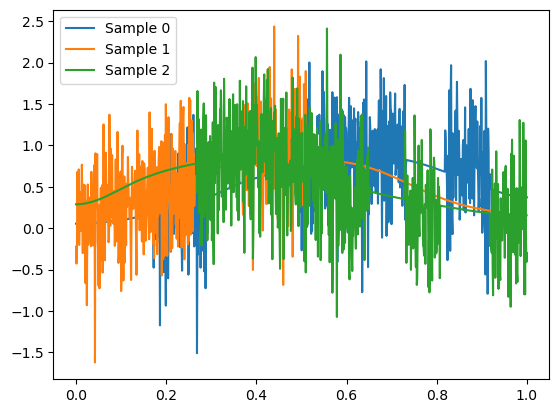

In [ ]:
recontructed = []
for i in range(n_clust):
    recontructed.append(data["1d"]["gauss"][s].iloc[i*n_obs_per_clust, :].copy())
    idx = obs_patterns["1d"]["area"][s].iloc[i*n_obs_per_clust, :] == 0
    recontructed[i][idx] = output_missing["1d"]["area"]["gauss"]["centroids"].iloc[s*n_clust + output_missing["1d"]["area"]["gauss"]["memberships"].iloc[s, i*n_obs_per_clust],:][idx]
    
for i in range(n_clust):
    plt.plot(data["1d"]["nodes"].iloc[:,0], recontructed[i], label=f"Sample {i}")
plt.legend()
plt.show()

### Accuracy

In [ ]:
labels_true = np.array([i for i in range(n_clust) for _ in range(n_obs_per_clust)])
metrics = ["ari", "nmi", "fmi", "homogeneity", "completeness", "v_measure"]
results_missing["1d"] = defaultdict(lambda: defaultdict(lambda: defaultdict(dict)))

for typ in ["scatter", "area"]:
    for curve in ["gauss", "wave"]:
        labels_pred = output_missing["1d"][typ][curve]["memberships"]
        N = labels_pred.shape[0]

        # Compute raw metrics for each run
        results_missing["1d"][typ][curve]["ari"]["raw"] = [adjusted_rand_score(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]
        results_missing["1d"][typ][curve]["nmi"]["raw"] = [normalized_mutual_info_score(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]
        results_missing["1d"][typ][curve]["fmi"]["raw"] = [fowlkes_mallows_score(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]

        hcv = [homogeneity_completeness_v_measure(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]
        h, c, v = zip(*hcv)
        results_missing["1d"][typ][curve]["homogeneity"]["raw"] = list(h)
        results_missing["1d"][typ][curve]["completeness"]["raw"] = list(c)
        results_missing["1d"][typ][curve]["v_measure"]["raw"] = list(v)

        # Compute means
        for m in metrics:
            results_missing["1d"][typ][curve][m]["mean"] = np.mean(results_missing["1d"][typ][curve][m]["raw"])

rows = []
for curve in ["gauss", "wave"]:
    for typ in ["scatter", "area", "full"]:
        row = {
            "Type": typ,
            "Curve": curve,
        }
        for m in metrics:
            if typ == "full":
                row[m.upper()] = results["1d"]["reg"][curve][m]["mean"]
            else:
                row[m.upper()] = results_missing["1d"][typ][curve][m]["mean"]
        rows.append(row)

df = pd.DataFrame(rows)
df


,Type,Curve,ARI,NMI,FMI,HOMOGENEITY,COMPLETENESS,V_MEASURE
0,scatter,gauss,0.982285,0.98204,0.988173,0.981578,0.982517,0.98204
1,area,gauss,0.722962,0.74750,0.816361,0.740011,0.755281,0.74750
2,full,gauss,1.000000,1.00000,1.000000,1.000000,1.000000,1.00000
3,scatter,wave,1.000000,1.00000,1.000000,1.000000,1.000000,1.00000
4,area,wave,0.732010,0.75400,0.823132,0.746283,0.762094,0.75400
5,full,wave,1.000000,1.00000,1.000000,1.000000,1.000000,1.00000


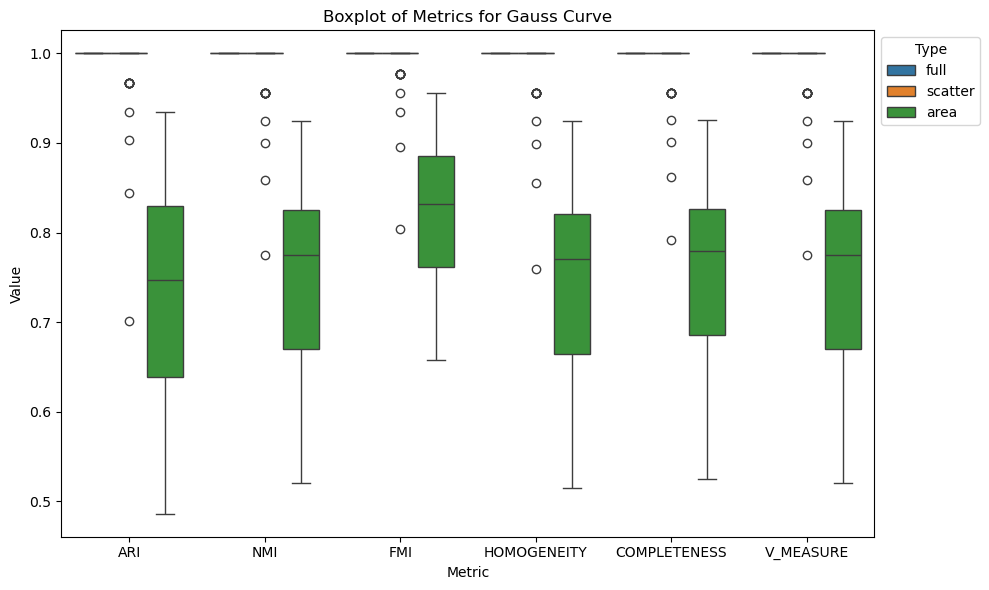

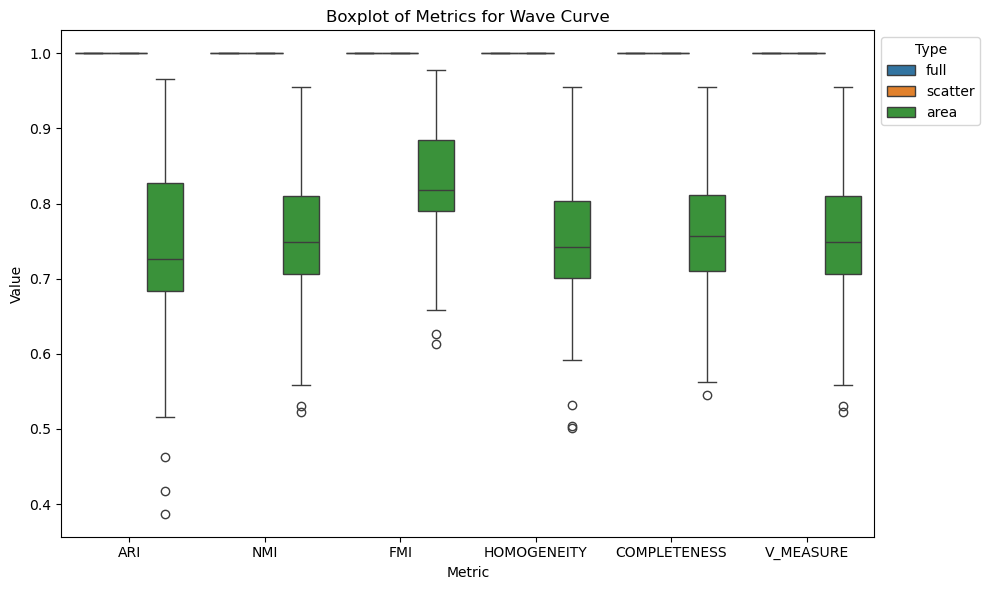

In [ ]:
#create dataframe for boxplots
# df_box = pd.DataFrame(columns=["Type", "Curve", "Metric", "Value"])
df_box = []
for curve in ["gauss", "wave"]:
    for typ in ["full", "scatter", "area"]:
        for m in metrics:
            values = results_missing["1d"][typ][curve][m]["raw"] if typ != "full" else results["1d"]["reg"][curve][m]["raw"]
            for value in values:
                df_box.append({
                    "Type": typ,
                    "Curve": curve,
                    "Metric": m.upper(),
                    "Value": value
                })
# Convert to DataFrame
df_box = pd.DataFrame(df_box)
# Create boxplots for each curve
for curve in ["gauss", "wave"]:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x="Metric", y="Value", hue="Type", data=df_box[df_box["Curve"] == curve])
    plt.title(f"Boxplot of Metrics for {curve.capitalize()} Curve")
    plt.legend(title="Type", bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

In [ ]:
# df.to_csv("missing_1d.csv", index=False)

## 2D

In [33]:
Z_missing = {}
surfaces_missing = {}

x2d_unique = data["2d"]["nodes"].iloc[:,0].unique()
y2d_unique = data["2d"]["nodes"].iloc[:,1].unique()
X2d, Y2d = np.meshgrid(x2d_unique, y2d_unique)

for n in range(5):
    Z_missing[f"samples_{n}"] = {}
    surfaces_missing[f"samples_{n}"] = {}
    for typ in ["scatter", "area"]:
        Z_missing[f"samples_{n}"][typ] = {}
        surfaces_missing[f"samples_{n}"][typ] = {}
        for curve in ["gauss"]: #, "wave"
            Z_missing[f"samples_{n}"][typ][curve] = []
            surfaces_missing[f"samples_{n}"][typ][curve] = []
            for i in range(n_clust):
                surfaces_missing[f"samples_{n}"][typ][curve].append(pd.DataFrame(np.zeros((data["2d"]["nodes"].shape[0], 3))))
                for j in range(data["2d"]["nodes"].shape[0]):
                    surfaces_missing[f"samples_{n}"][typ][curve][i].iloc[j, 0] = data["2d"]["nodes"].iloc[j, 0]
                    surfaces_missing[f"samples_{n}"][typ][curve][i].iloc[j, 1] = data["2d"]["nodes"].iloc[j, 1]
                    if obs_patterns["2d"][typ][s].iloc[i*n_obs_per_clust + n, j] == 0:
                        surfaces_missing[f"samples_{n}"][typ][curve][i].iloc[j, 2] = np.nan
                    else:
                        surfaces_missing[f"samples_{n}"][typ][curve][i].iloc[j, 2] = data["2d"][curve][s].iloc[i*n_obs_per_clust + n, j]
                surfaces_missing[f"samples_{n}"][typ][curve][i].columns = ['x', 'y', 'z']
                Z_missing[f"samples_{n}"][typ][curve].append(surfaces_missing[f"samples_{n}"][typ][curve][i].pivot_table(index='y', columns='x', values='z').values)

Z_missing["centroids"] = {}
surfaces_missing["centroids"] = {}
for typ in ["scatter", "area"]:
    Z_missing["centroids"][typ] = {}
    surfaces_missing["centroids"][typ] = {}
    for curve in ["gauss"]: #, "wave"
        Z_missing["centroids"][typ][curve] = []
        surfaces_missing["centroids"][typ][curve] = []
        for i in range(n_clust):
            surfaces_missing["centroids"][typ][curve].append(pd.DataFrame(np.zeros((data["2d"]["nodes"].shape[0], 3))))
            for j in range(data["2d"]["nodes"].shape[0]):
                surfaces_missing["centroids"][typ][curve][i].iloc[j, 0] = data["2d"]["nodes"].iloc[j, 0]
                surfaces_missing["centroids"][typ][curve][i].iloc[j, 1] = data["2d"]["nodes"].iloc[j, 1]
                surfaces_missing["centroids"][typ][curve][i].iloc[j, 2] = output_missing["2d"][typ][curve]["centroids"].iloc[s*n_clust + i, j]
            surfaces_missing["centroids"][typ][curve][i].columns = ['x', 'y', 'z']
            Z_missing["centroids"][typ][curve].append(surfaces_missing["centroids"][typ][curve][i].pivot_table(index='y', columns='x', values='z').values)

Z_missing["reconstructed"] = {}
surfaces_missing["reconstructed"] = {}
for typ in ["scatter", "area"]:
    Z_missing["reconstructed"][typ] = {}
    surfaces_missing["reconstructed"][typ] = {}
    for curve in ["gauss"]: #, "wave"
        Z_missing["reconstructed"][typ][curve] = []
        surfaces_missing["reconstructed"][typ][curve] = []
        for i in range(n_clust):
            surfaces_missing["reconstructed"][typ][curve].append(pd.DataFrame(np.zeros((data["2d"]["nodes"].shape[0], 3))))
            for j in range(data["2d"]["nodes"].shape[0]):
                surfaces_missing["reconstructed"][typ][curve][i].iloc[j, 0] = data["2d"]["nodes"].iloc[j, 0]
                surfaces_missing["reconstructed"][typ][curve][i].iloc[j, 1] = data["2d"]["nodes"].iloc[j, 1]
                if obs_patterns["2d"][typ][s].iloc[i*n_obs_per_clust, j] == 0:
                    surfaces_missing["reconstructed"][typ][curve][i].iloc[j, 2] = output_missing["2d"][typ][curve]["centroids"].iloc[s*n_clust + output_missing["2d"][typ][curve]["memberships"].iloc[s, i*n_obs_per_clust],j]
                else:
                    surfaces_missing["reconstructed"][typ][curve][i].iloc[j, 2] = data["2d"][curve][s].iloc[i*n_obs_per_clust, j]
            surfaces_missing["reconstructed"][typ][curve][i].columns = ['x', 'y', 'z']
            Z_missing["reconstructed"][typ][curve].append(surfaces_missing["reconstructed"][typ][curve][i].pivot_table(index='y', columns='x', values='z').values)

### Samples

In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Surface(z=Z_missing["samples"]["scatter"]["wave"][i], x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z_missing["samples"]["scatter"]["wave"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )
    fig.show()


In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Surface(z=Z_missing["samples"]["area"]["wave"][i], x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z_missing["samples"]["area"]["wave"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )
    fig.show()


In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Surface(z=Z_missing["samples"]["scatter"]["gauss"][i], x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

In [36]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z_missing["samples_0"]["scatter"]["gauss"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )

    for gx in np.arange(min(x2d_unique), max(x2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[gx, gx],
            y=[min(y2d_unique), max(y2d_unique)],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))
    for gy in np.arange(min(y2d_unique), max(y2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[min(x2d_unique), max(x2d_unique)],
            y=[gy, gy],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))
    fig.update_xaxes(range=[0, 1])
    fig.update_yaxes(range=[0, 1])
      

    fig.show()


In [37]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z_missing["samples_1"]["scatter"]["gauss"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )

    for gx in np.arange(min(x2d_unique), max(x2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[gx, gx],
            y=[min(y2d_unique), max(y2d_unique)],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))
    for gy in np.arange(min(y2d_unique), max(y2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[min(x2d_unique), max(x2d_unique)],
            y=[gy, gy],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))
    fig.update_xaxes(range=[0, 1])
    fig.update_yaxes(range=[0, 1])
      

    fig.show()


In [38]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z_missing["samples_2"]["scatter"]["gauss"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )

    for gx in np.arange(min(x2d_unique), max(x2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[gx, gx],
            y=[min(y2d_unique), max(y2d_unique)],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))
    for gy in np.arange(min(y2d_unique), max(y2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[min(x2d_unique), max(x2d_unique)],
            y=[gy, gy],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))
    fig.update_xaxes(range=[0, 1])
    fig.update_yaxes(range=[0, 1])
      

    fig.show()


In [39]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z_missing["samples_3"]["scatter"]["gauss"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )

    for gx in np.arange(min(x2d_unique), max(x2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[gx, gx],
            y=[min(y2d_unique), max(y2d_unique)],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))
    for gy in np.arange(min(y2d_unique), max(y2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[min(x2d_unique), max(x2d_unique)],
            y=[gy, gy],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))
    fig.update_xaxes(range=[0, 1])
    fig.update_yaxes(range=[0, 1])
      

    fig.show()


In [40]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z_missing["samples_4"]["scatter"]["gauss"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )

    for gx in np.arange(min(x2d_unique), max(x2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[gx, gx],
            y=[min(y2d_unique), max(y2d_unique)],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))
    for gy in np.arange(min(y2d_unique), max(y2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[min(x2d_unique), max(x2d_unique)],
            y=[gy, gy],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))
    fig.update_xaxes(range=[0, 1])
    fig.update_yaxes(range=[0, 1])
      

    fig.show()


In [41]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Surface(z=Z_missing["samples"]["area"]["gauss"][i], x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

KeyError: 'samples'

In [42]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z_missing["samples_0"]["area"]["gauss"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )
    for gx in np.arange(min(x2d_unique), max(x2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[gx, gx],
            y=[min(y2d_unique), max(y2d_unique)],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))
    for gy in np.arange(min(y2d_unique), max(y2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[min(x2d_unique), max(x2d_unique)],
            y=[gy, gy],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))
    fig.update_xaxes(range=[0, 1])
    fig.update_yaxes(range=[0, 1])
    fig.show()


In [43]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z_missing["samples_1"]["area"]["gauss"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )
    for gx in np.arange(min(x2d_unique), max(x2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[gx, gx],
            y=[min(y2d_unique), max(y2d_unique)],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))
    for gy in np.arange(min(y2d_unique), max(y2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[min(x2d_unique), max(x2d_unique)],
            y=[gy, gy],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))
    fig.update_xaxes(range=[0, 1])
    fig.update_yaxes(range=[0, 1])
    fig.show()


In [44]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z_missing["samples_2"]["area"]["gauss"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )
    for gx in np.arange(min(x2d_unique), max(x2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[gx, gx],
            y=[min(y2d_unique), max(y2d_unique)],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))
    for gy in np.arange(min(y2d_unique), max(y2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[min(x2d_unique), max(x2d_unique)],
            y=[gy, gy],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))
    fig.update_xaxes(range=[0, 1])
    fig.update_yaxes(range=[0, 1])
    fig.show()


In [45]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z_missing["samples_3"]["area"]["gauss"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )
    for gx in np.arange(min(x2d_unique), max(x2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[gx, gx],
            y=[min(y2d_unique), max(y2d_unique)],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))
    for gy in np.arange(min(y2d_unique), max(y2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[min(x2d_unique), max(x2d_unique)],
            y=[gy, gy],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))
    fig.update_xaxes(range=[0, 1])
    fig.update_yaxes(range=[0, 1])
    fig.show()


In [46]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z_missing["samples_4"]["area"]["gauss"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )
    for gx in np.arange(min(x2d_unique), max(x2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[gx, gx],
            y=[min(y2d_unique), max(y2d_unique)],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))
    for gy in np.arange(min(y2d_unique), max(y2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[min(x2d_unique), max(x2d_unique)],
            y=[gy, gy],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))
    fig.update_xaxes(range=[0, 1])
    fig.update_yaxes(range=[0, 1])
    fig.show()


### Centroids

In [47]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Surface(z=Z_missing["centroids"]["scatter"]["wave"][i], x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

KeyError: 'wave'

In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z_missing["centroids"]["scatter"]["wave"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )
    fig.show()


In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Surface(z=Z_missing["centroids"]["area"]["wave"][i], x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z_missing["centroids"]["area"]["wave"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )
    fig.show()


In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Surface(z=Z_missing["centroids"]["scatter"]["gauss"][i], x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z_missing["centroids"]["scatter"]["gauss"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )

    for gx in np.arange(min(x2d_unique), max(x2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[gx, gx],
            y=[min(y2d_unique), max(y2d_unique)],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))

    for gy in np.arange(min(y2d_unique), max(y2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[min(x2d_unique), max(x2d_unique)],
            y=[gy, gy],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))

    fig.update_xaxes(range=[0, 1])
    fig.update_yaxes(range=[0, 1])
    fig.show()


In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Surface(z=Z_missing["centroids"]["area"]["gauss"][i], x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

KeyError: 'area'

In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z_missing["centroids"]["area"]["gauss"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )

    for gx in np.arange(min(x2d_unique), max(x2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[gx, gx],
            y=[min(y2d_unique), max(y2d_unique)],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))

    for gy in np.arange(min(y2d_unique), max(y2d_unique), 0.2):
        fig.add_trace(go.Scatter(
            x=[min(x2d_unique), max(x2d_unique)],
            y=[gy, gy],
            mode="lines",
            line=dict(color="white", width=1),
            showlegend=False
        ))

    fig.update_xaxes(range=[0, 1])
    fig.update_yaxes(range=[0, 1])
    fig.show()


### Reconstructed Samples

In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Surface(z=Z_missing["reconstructed"]["scatter"]["wave"][i], x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z_missing["reconstructed"]["scatter"]["wave"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )
    fig.show()


KeyError: 'wave'

In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Surface(z=Z_missing["reconstructed"]["area"]["wave"][i], x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z_missing["reconstructed"]["area"]["wave"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )
    fig.show()


In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Surface(z=Z_missing["reconstructed"]["scatter"]["gauss"][i], x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z_missing["reconstructed"]["scatter"]["gauss"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )
    fig.show()


In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Surface(z=Z_missing["reconstructed"]["area"]["gauss"][i], x=X2d, y=Y2d, name=f'Sample {i}', colorscale='Viridis', showscale=False))
    fig.update_layout(
        scene=dict(
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        autosize=False,
        width=800,
        height=800,
    )
    fig.show()

In [ ]:
for i in range(n_clust):
    fig = go.Figure()
    fig.add_trace(go.Contour(
        x=x2d_unique, y=y2d_unique, z=Z_missing["reconstructed"]["area"]["gauss"][i],
        colorscale='Viridis',
        name=f'Sample {i}',
        contours=dict(showlabels=True)
    ))
    fig.update_layout(
        xaxis_title="X",
        yaxis_title="Y",
        height=700,
        width=700
    )
    fig.show()


### Accuracy

In [ ]:
labels_true = np.array([i for i in range(n_clust) for _ in range(n_obs_per_clust)])
metrics = ["ari", "nmi", "fmi", "homogeneity", "completeness", "v_measure"]
results_missing["2d"] = defaultdict(lambda: defaultdict(lambda: defaultdict(dict)))

for typ in ["scatter", "area"]:
    for curve in ["gauss", "wave"]:
        labels_pred = output_missing["2d"][typ][curve]["memberships"]
        N = labels_pred.shape[0]

        # Compute raw metrics for each run
        results_missing["2d"][typ][curve]["ari"]["raw"] = [adjusted_rand_score(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]
        results_missing["2d"][typ][curve]["nmi"]["raw"] = [normalized_mutual_info_score(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]
        results_missing["2d"][typ][curve]["fmi"]["raw"] = [fowlkes_mallows_score(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]

        hcv = [homogeneity_completeness_v_measure(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]
        h, c, v = zip(*hcv)
        results_missing["2d"][typ][curve]["homogeneity"]["raw"] = list(h)
        results_missing["2d"][typ][curve]["completeness"]["raw"] = list(c)
        results_missing["2d"][typ][curve]["v_measure"]["raw"] = list(v)

        # Compute means
        for m in metrics:
            results_missing["2d"][typ][curve][m]["mean"] = np.mean(results_missing["2d"][typ][curve][m]["raw"])

rows = []
for curve in ["gauss", "wave"]:
    for typ in ["scatter", "area", "full"]:
        row = {
            "Type": typ,
            "Curve": curve,
        }
        for m in metrics:
            if typ == "full":
                row[m.upper()] = results["2d"]["reg"][curve][m]["mean"]
            else:
                row[m.upper()] = results_missing["2d"][typ][curve][m]["mean"]
        rows.append(row)

df = pd.DataFrame(rows)
df


,Type,Curve,ARI,NMI,FMI,HOMOGENEITY,COMPLETENESS,V_MEASURE
0,scatter,gauss,0.966956,0.964265,0.977792,0.963802,0.964732,0.964265
1,area,gauss,0.689169,0.716894,0.795477,0.707909,0.726394,0.716894
2,full,gauss,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
3,scatter,wave,0.931226,0.927485,0.954379,0.925894,0.929197,0.927485
4,area,wave,0.590946,0.634230,0.733977,0.621086,0.648669,0.634230
5,full,wave,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


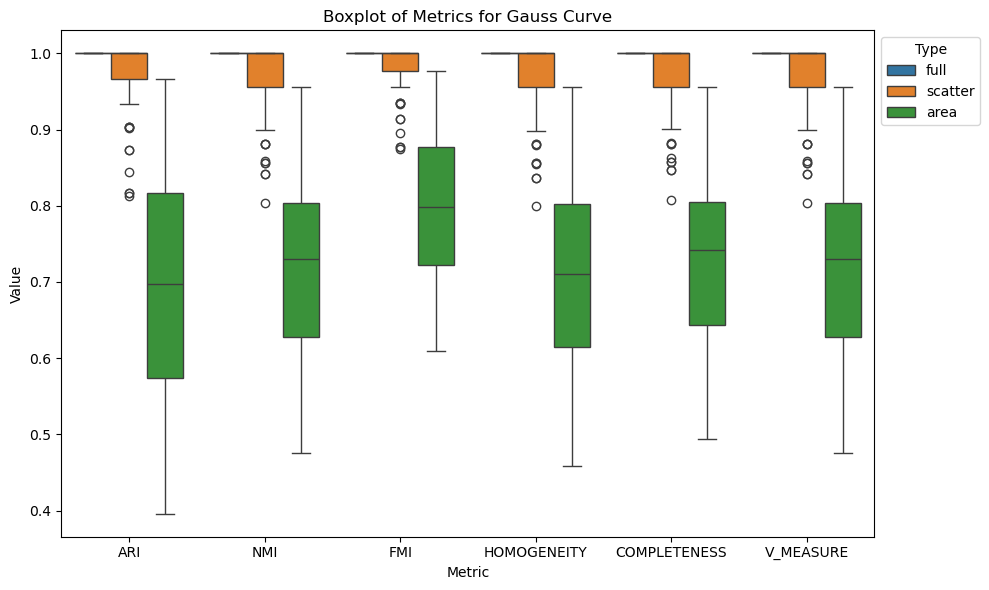

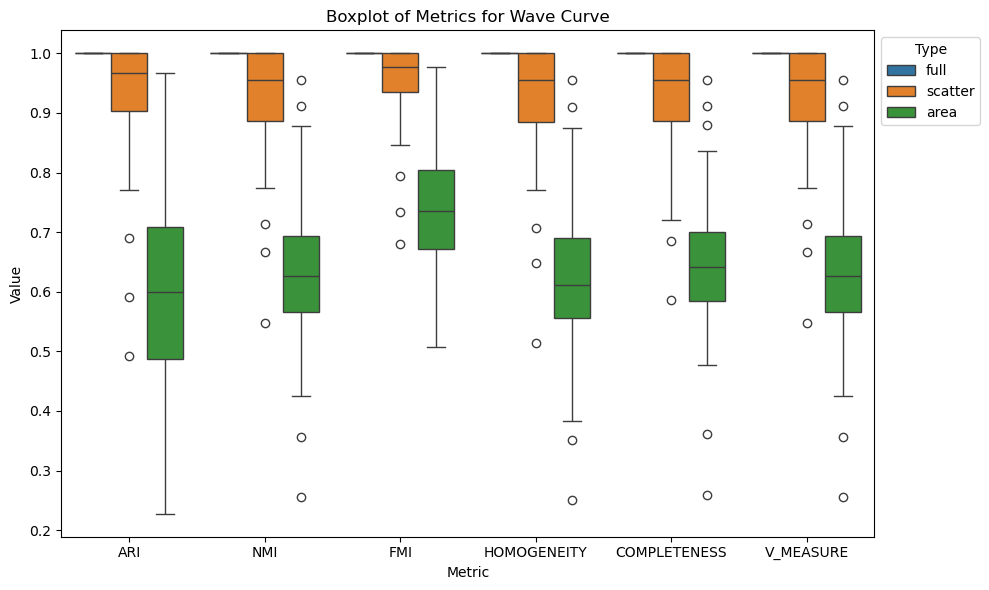

In [ ]:
#create dataframe for boxplots
# df_box = pd.DataFrame(columns=["Type", "Curve", "Metric", "Value"])
df_box = []
for curve in ["gauss", "wave"]:
    for typ in ["full", "scatter", "area"]:
        for m in metrics:
            values = results_missing["2d"][typ][curve][m]["raw"] if typ != "full" else results["2d"]["reg"][curve][m]["raw"]
            for value in values:
                df_box.append({
                    "Type": typ,
                    "Curve": curve,
                    "Metric": m.upper(),
                    "Value": value
                })
# Convert to DataFrame
df_box = pd.DataFrame(df_box)
# Create boxplots for each curve
for curve in ["gauss", "wave"]:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x="Metric", y="Value", hue="Type", data=df_box[df_box["Curve"] == curve])
    plt.title(f"Boxplot of Metrics for {curve.capitalize()} Curve")
    plt.legend(title="Type", bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

In [ ]:
# df.to_csv("missing_2d.csv", index=False)

## 3D

### Accuracy

In [ ]:
labels_true = np.array([i for i in range(n_clust) for _ in range(n_obs_per_clust)])
metrics = ["ari", "nmi", "fmi", "homogeneity", "completeness", "v_measure"]
results_missing["3d"] = defaultdict(lambda: defaultdict(lambda: defaultdict(dict)))

for typ in ["scatter", "area"]:
    for curve in ["gauss", "wave"]:
        labels_pred = output_missing["3d"][typ][curve]["memberships"]
        N = labels_pred.shape[0]

        # Compute raw metrics for each run
        results_missing["3d"][typ][curve]["ari"]["raw"] = [adjusted_rand_score(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]
        results_missing["3d"][typ][curve]["nmi"]["raw"] = [normalized_mutual_info_score(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]
        results_missing["3d"][typ][curve]["fmi"]["raw"] = [fowlkes_mallows_score(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]

        hcv = [homogeneity_completeness_v_measure(labels_true, labels_pred.iloc[i, :].values) for i in range(N)]
        h, c, v = zip(*hcv)
        results_missing["3d"][typ][curve]["homogeneity"]["raw"] = list(h)
        results_missing["3d"][typ][curve]["completeness"]["raw"] = list(c)
        results_missing["3d"][typ][curve]["v_measure"]["raw"] = list(v)

        # Compute means
        for m in metrics:
            results_missing["3d"][typ][curve][m]["mean"] = np.mean(results_missing["3d"][typ][curve][m]["raw"])

rows = []
for curve in ["gauss", "wave"]:
    for typ in ["scatter", "area", "full"]:
        row = {
            "Type": typ,
            "Curve": curve,
        }
        for m in metrics:
            if typ == "full":
                row[m.upper()] = results["3d"]["reg"][curve][m]["mean"]
            else:
                row[m.upper()] = results_missing["3d"][typ][curve][m]["mean"]
        rows.append(row)

df = pd.DataFrame(rows)
df


,Type,Curve,ARI,NMI,FMI,HOMOGENEITY,COMPLETENESS,V_MEASURE
0,scatter,gauss,0.822016,0.826556,0.883013,0.821544,0.832193,0.826556
1,area,gauss,0.560047,0.606153,0.714733,0.590961,0.623138,0.606153
2,full,gauss,0.995307,0.993767,0.996836,0.993745,0.993790,0.993767
3,scatter,wave,0.451868,0.470018,0.649960,0.458420,0.484391,0.470018
4,area,wave,0.277402,0.331191,0.548517,0.313287,0.354526,0.331191
5,full,wave,0.917272,0.915994,0.946450,0.913045,0.919777,0.915994


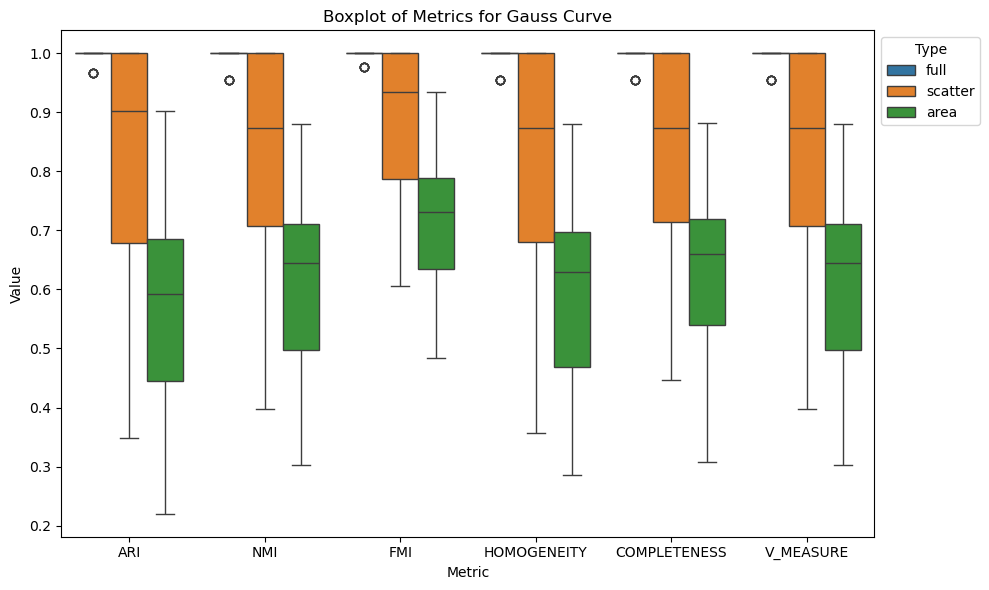

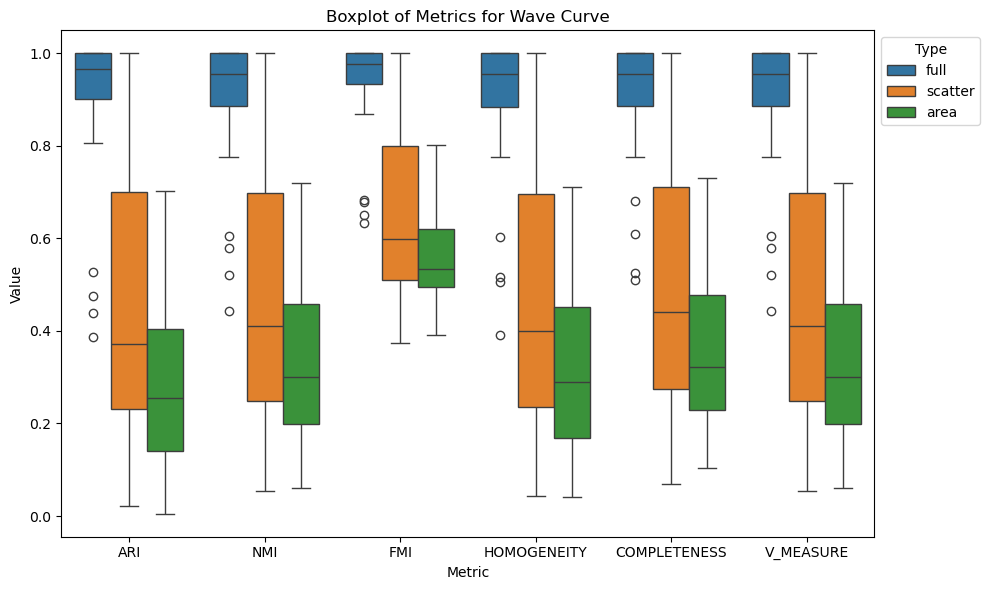

In [ ]:
#create dataframe for boxplots
# df_box = pd.DataFrame(columns=["Type", "Curve", "Metric", "Value"])
df_box = []
for curve in ["gauss", "wave"]:
    for typ in ["full", "scatter", "area"]:
        for m in metrics:
            values = results_missing["3d"][typ][curve][m]["raw"] if typ != "full" else results["3d"]["reg"][curve][m]["raw"]
            for value in values:
                df_box.append({
                    "Type": typ,
                    "Curve": curve,
                    "Metric": m.upper(),
                    "Value": value
                })
# Convert to DataFrame
df_box = pd.DataFrame(df_box)
# Create boxplots for each curve
for curve in ["gauss", "wave"]:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x="Metric", y="Value", hue="Type", data=df_box[df_box["Curve"] == curve])
    plt.title(f"Boxplot of Metrics for {curve.capitalize()} Curve")
    plt.legend(title="Type", bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

In [ ]:
# df.to_csv("missing_3d.csv", index=False)